# R1-6 outputs and their relationship to receptor morphology in the eye



In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
import seaborn as sns
import itertools
import statsmodels.api as sm

from vis.hex_lattice import hexplot
from vis.fig_tools import linear_cmap, subtype_cm

import matplotlib as mpl
#mpl.rc('font', size=14)

In [2]:
st_cm = subtype_cm()
plt.style.use('vis/lamina.mplstyle')
### SAVE FIGS? ###
save_figs = False
##################
# if save_figs:
#     fig.savefig('/mnt/home/nchua/Dropbox/lamina_figures/FNAME.svg')
#     fig.savefig('/mnt/home/nchua/Dropbox/lamina_figures/FNAME.png')

In [3]:
tp = '200914'
lamina_links = pd.read_pickle(f'~/Data/{tp}_lamina/{tp}_linkdf.pickle')

subtypes = np.unique([*lamina_links["pre_type"], *lamina_links["post_type"]])
all_ctypes = [p for p in itertools.product(subtypes, subtypes)]  
all_ctype_labels = [f"{pre}->{post}" for pre, post in all_ctypes]
om_list = ommatidia = np.unique(lamina_links['pre_om'])

df_lamina = pd.DataFrame(index=om_list, columns=all_ctype_labels)
for om, row in df_lamina.iterrows():
    for c in all_ctype_labels:
        pre_t, post_t = c.split('->')
        # Cartridges on the posterior edge lack L4, so their counts for these connections are NaNed 
        if om in ['B0', 'E4', 'E5', 'E6', 'E7', 'D2'] and post_t == 'LMC_4':
            df_lamina.loc[om, c] = np.nan
        else:
            df_lamina.loc[om, c] = sum((lamina_links.pre_om == om) & (lamina_links.post_om == om) & 
                                       (lamina_links.pre_type == pre_t) & (lamina_links.post_type == post_t))

In [4]:
svfs = ['R1', 'R2', 'R3', 'R4', 'R5', 'R6']
all_vfs = [*svfs, 'R7', 'R8', 'R7p']
lmcs = ['LMC_1', 'LMC_2', 'LMC_3', 'LMC_4', 'LMC_N']

In [5]:
#df_presites = pd.DataFrame(index=om_list, columns=all_vfs)
#df_outputs = pd.DataFrame(index=om_list, columns=all_vfs)

# long form dataframe with multiindex (om x svf subtype) might be easier to use
long = pd.DataFrame(index=pd.MultiIndex.from_product([om_list, all_vfs], names=['om', 'subtype']))

# Uses neuron name to query list of connections since pretype combines svfs pairs
for om in om_list:
    for s in all_vfs:
        neuron_name = f"om{om}_{s}"
        if om == 'C2':
            neuron_name += '_nc'
            
        links = lamina_links.loc[lamina_links['pre_neuron'] == neuron_name]
        lmc_links = links.loc[[i for i, v in links['post_type'].items() if v[0:3] == 'LMC']]
        c_ids = links['cx_id'].unique()
#         df_presites.loc[om, s] = len(c_ids)
#         df_outputs.loc[om, s] = len(links)
        
        long.loc[(om, s), 'presites'] = len(c_ids)
        long.loc[(om, s), 'syn'] = len(links)
        long.loc[(om, s), 'lmc_syn'] = len(lmc_links)
        for l in lmcs:
            long.loc[(om, s), f'->{l}'] = len(links.loc[[i for i, v in links['post_type'].items() if v == l]])
        if len(links) > 0 and s in svfs:
            long.loc[(om, s), 'syn_multi'] = len(links)/len(c_ids)
        elif len(links) > 0 and s not in svfs:
            long.loc[(om, s), 'syn_multi'] = len(links)/len(c_ids)
            display('Long photoreceptor has more than zero connections in the lamina. Check if this is real')
            display(links)
        else:
            # When links are 0 (lvfs), multiplicity is NaN
            long.loc[(om, s), 'syn_multi'] = np.nan

'Long photoreceptor has more than zero connections in the lamina. Check if this is real'

,link_id,cx_id,pre_neuron,pre_om,pre_type,pre_skel,post_neuron,post_om,post_type,post_skel
13301,228363,328663,omB0_R7p,B0,R7p,216709,omB0_R5,B0,R2R5,214441
13302,228356,328663,omB0_R7p,B0,R7p,216709,omB0_L3,B0,LMC_3,216748
13303,228351,328663,omB0_R7p,B0,R7p,216709,omB0_L1,B0,LMC_1,216758
13304,228350,328663,omB0_R7p,B0,R7p,216709,omB0_L3,B0,LMC_3,216748
13305,228349,328663,omB0_R7p,B0,R7p,216709,omB0_R8,B0,R8,167684
13306,228348,328663,omB0_R7p,B0,R7p,216709,omB0_L2,B0,LMC_2,216753
13307,228347,328663,omB0_R7p,B0,R7p,216709,omB0_R7p,B0,R7p,216709


'Long photoreceptor has more than zero connections in the lamina. Check if this is real'

,link_id,cx_id,pre_neuron,pre_om,pre_type,pre_skel,post_neuron,post_om,post_type,post_skel
9285,272363,423249,omB5_R8,B5,R8,165923,omB5_R7,B5,R7,241264
9286,272362,423249,omB5_R8,B5,R8,165923,omB5_R7p,B5,R7p,241249


'Long photoreceptor has more than zero connections in the lamina. Check if this is real'

,link_id,cx_id,pre_neuron,pre_om,pre_type,pre_skel,post_neuron,post_om,post_type,post_skel
6647,153663,248469,omD5_R8,D5,R8,143980,omD5_R7,D5,R7,14191
6648,153649,248469,omD5_R8,D5,R8,143980,omD5_L1,D5,LMC_1,143917
6649,153650,248469,omD5_R8,D5,R8,143980,omD5_C,D5,centri,145113


In [6]:
# To retrive the indices of groups of subtypes in the longform df
r1r4r3r6_ind = (slice(None),['R1', 'R3', 'R4', 'R6'])
r2r5_ind = (slice(None),['R2', 'R5'])

In [7]:
# Volume data from excel provided by AM. 
# Contains both the volume of each PR's cell body, and the volume of just their rhabdomeres
xl_dir = '~/Data/cell_rbd_volume.xlsx'
full_df = pd.read_excel(xl_dir, header=[0, 1], index_col=0, nrows=9)

# Each om has two columns: cell body and rhabdomere vol 
rbd = dict.fromkeys(full_df.columns.levels[0])
soma = dict.fromkeys(full_df.columns.levels[0])

for om in full_df.columns.levels[0]:
    rbd[om] = full_df.loc[:, (om, 'rbd')]
    soma[om] = full_df.loc[:, (om, 'cell body')]
    
vol_df = pd.DataFrame(rbd)
# E5 was damaged in our specimen so Anastasia took measurements from an E5 in a different wasp
vol_df = vol_df.rename(mapper={"R7'": "R7p"}, axis=0).rename(mapper={"E5*": "E5"}, axis=1).T
soma_df = pd.DataFrame(soma)
soma_df = soma_df.rename(mapper={"R7'": "R7p"}, axis=0).rename(mapper={"E5*": "E5"}, axis=1).T
# append this to the long form dataframe
for om, row in vol_df.iterrows():
    total = row.sum()
    for s, v in row.items():
        long.loc[(om, s), 'rbd_vol'] = v
        long.loc[(om, s), 'rbd_frac'] = v/total
        long.loc[(om, s), 'soma_vol'] = soma_df.loc[om, s]

## Mean and variance of individual R1-6

In [8]:
display('Average across ommatidia', long.groupby('subtype').mean().round(decimals=1))
display('Standard deviation', long.groupby('subtype').std().round(decimals=1))

'Average across ommatidia'

,presites,syn,lmc_syn,->LMC_1,->LMC_2,->LMC_3,->LMC_4,->LMC_N,syn_multi,rbd_vol,rbd_frac,soma_vol
subtype,,,,,,,,,,,,
R1,9.0,69.9,53.9,18.1,22.8,9.2,3.4,0.3,7.8,3.3,0.1,19.7
R2,12.7,105.0,73.3,18.0,27.0,18.7,9.4,0.2,8.3,4.8,0.1,27.6
R3,8.9,72.6,56.4,17.8,22.7,10.8,4.4,0.8,8.2,2.9,0.1,20.6
R4,8.8,71.6,55.0,17.2,22.9,10.5,3.6,0.8,8.1,3.0,0.1,20.8
R5,12.6,103.0,73.2,17.2,26.8,18.5,10.2,0.6,8.2,5.0,0.1,29.0
R6,8.8,66.4,51.4,15.5,21.3,9.7,4.1,0.8,7.6,2.7,0.1,19.5
R7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,5.0,0.1,31.1
R7p,0.0,0.2,0.1,0.0,0.0,0.1,0.0,0.0,7.0,9.7,0.2,46.2
R8,0.1,0.2,0.0,0.0,0.0,0.0,0.0,0.0,2.5,4.7,0.1,23.7


'Standard deviation'

,presites,syn,lmc_syn,->LMC_1,->LMC_2,->LMC_3,->LMC_4,->LMC_N,syn_multi,rbd_vol,rbd_frac,soma_vol
subtype,,,,,,,,,,,,
R1,1.5,18.2,12.8,5.8,5.0,6.4,2.3,0.9,1.4,1.7,0.0,3.3
R2,1.4,12.6,9.3,3.4,5.2,4.2,3.9,0.8,0.9,1.7,0.0,4.2
R3,1.8,17.7,14.0,6.1,5.5,5.4,3.7,1.1,1.2,0.9,0.0,3.2
R4,1.4,15.8,12.0,5.1,7.2,4.2,3.4,1.2,1.3,1.4,0.0,3.8
R5,1.7,13.7,11.3,4.1,5.6,4.9,4.7,1.2,0.8,1.6,0.0,4.5
R6,1.6,12.8,10.3,4.7,4.7,5.1,3.3,1.5,1.4,1.0,0.0,3.9
R7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,1.9,0.1,7.4
R7p,0.2,1.3,0.7,0.2,0.2,0.4,0.0,0.0,NaN,5.3,0.1,13.3
R8,0.3,0.7,0.2,0.2,0.0,0.0,0.0,0.0,0.7,3.1,0.0,6.7


## Compare R2/R5 with (R1/R4, R3/6)

In [9]:
svf_comp =  pd.DataFrame(index=pd.MultiIndex.from_product([['R2, R5', 'R1, R3, R4, R6'], ['Mean', 'SD']],  
                                                          names=['class', 'statistic']), columns=long.columns)
svf_comp.loc[('R2, R5', 'Mean'), :] =  long.loc[r2r5_ind, :].mean()
svf_comp.loc[('R2, R5', 'SD'), :] =  long.loc[r2r5_ind, :].std(ddof=0)
svf_comp.loc[('R1, R3, R4, R6', 'Mean'), :] =  long.loc[r1r4r3r6_ind, :].mean()
svf_comp.loc[('R1, R3, R4, R6', 'SD'), :] =  long.loc[r1r4r3r6_ind, :].std(ddof=0)

display(svf_comp.round(decimals=1))

# display(long.loc[r1r4r3r6_ind, :].mean())
# display(long.loc[r2r5_ind, :].mean())
# display(long.loc[r1r4r3r6_ind, :].std())
# display(long.loc[r2r5_ind, :].std())
# display(long.loc[r1r4r3r6_ind, :].mean() / long.loc[r2r5_ind, :].mean())
# display(long.loc[r2r5_ind, :].mean() / long.loc[r1r4r3r6_ind, :].mean())

presites      syn  lmc_syn  ->LMC_1  ->LMC_2  \
class          statistic                                                
R2, R5         Mean       12.6034  104.017  73.2586  17.6034  26.8793   
               SD          1.5306  12.9488  10.1838  3.71363  5.32747   
R1, R3, R4, R6 Mean       8.87069  70.1034  54.1638  17.1379  22.4224   
               SD         1.55658   16.145   12.298  5.43123  5.65251   

                          ->LMC_3  ->LMC_4   ->LMC_N syn_multi  rbd_vol  \
class          statistic                                                  
R2, R5         Mean       18.5862  9.77586  0.413793   8.29028  4.85991   
               SD         4.48382  4.26713   1.05102  0.841574  1.58428   
R1, R3, R4, R6 Mean       10.0431  3.86207  0.698276   7.92658  2.96247   
               SD         5.27419  3.19454   1.20502    1.3272  1.30808   

                           rbd_frac soma_vol  
class          statistic                      
R2, R5         Mean        0.123055  28.3337  
               SD         0.0206367  4.31359  
R1, R3, R4, R6 Mean       0.0735698  20.1646  
               SD         0.0191979  3.52564

In [10]:
# Make sure the long dataframe has a row for every photoreceptor
assert(len(long) == 29 * 9)

## Ratio of these measures between classes
mean(mean(R2, R5) / mean(R1, R4, R3, R6))

In [11]:
om_ratio = dict()
for om, rows in long.groupby('om'):
    #om_ratio.update({om: 1-(rows.loc[r1r4r3r6_ind, :].mean()/rows.loc[r2r5_ind, :].mean())})
    om_ratio.update({om: rows.loc[r2r5_ind, :].mean() / rows.loc[r1r4r3r6_ind, :].mean()})
    #om_ratio.update({om: (rows.loc[r2r5_ind, :].mean() - rows.loc[r1r4r3r6_ind, :].mean()) / rows.loc[r1r4r3r6_ind, :].mean()})
ratio_df = pd.DataFrame(om_ratio).T

for var, x in ratio_df.mean().items():
    display(f'R2/R5 receptors have {x: .2f} +/- {ratio_df[var].std(ddof=0): .2f}' +
            f'x the {var} of R1/R4 or R3/6 receptors')
# display(ratio_df.mean())
# display(ratio_df.std())

'R2/R5 receptors have  1.44 +/-  0.17x the presites of R1/R4 or R3/6 receptors'

'R2/R5 receptors have  1.52 +/-  0.24x the syn of R1/R4 or R3/6 receptors'

'R2/R5 receptors have  1.39 +/-  0.28x the lmc_syn of R1/R4 or R3/6 receptors'

'R2/R5 receptors have  1.06 +/-  0.22x the ->LMC_1 of R1/R4 or R3/6 receptors'

'R2/R5 receptors have  1.23 +/-  0.31x the ->LMC_2 of R1/R4 or R3/6 receptors'

'R2/R5 receptors have  2.08 +/-  0.75x the ->LMC_3 of R1/R4 or R3/6 receptors'

'R2/R5 receptors have  3.66 +/-  2.67x the ->LMC_4 of R1/R4 or R3/6 receptors'

'R2/R5 receptors have  inf +/-  nanx the ->LMC_N of R1/R4 or R3/6 receptors'

'R2/R5 receptors have  1.06 +/-  0.12x the syn_multi of R1/R4 or R3/6 receptors'

'R2/R5 receptors have  1.71 +/-  0.33x the rbd_vol of R1/R4 or R3/6 receptors'

'R2/R5 receptors have  1.71 +/-  0.33x the rbd_frac of R1/R4 or R3/6 receptors'

'R2/R5 receptors have  1.41 +/-  0.13x the soma_vol of R1/R4 or R3/6 receptors'

## Correlation of rhabdomere measurements with number of lamina outputs

### All R1-6

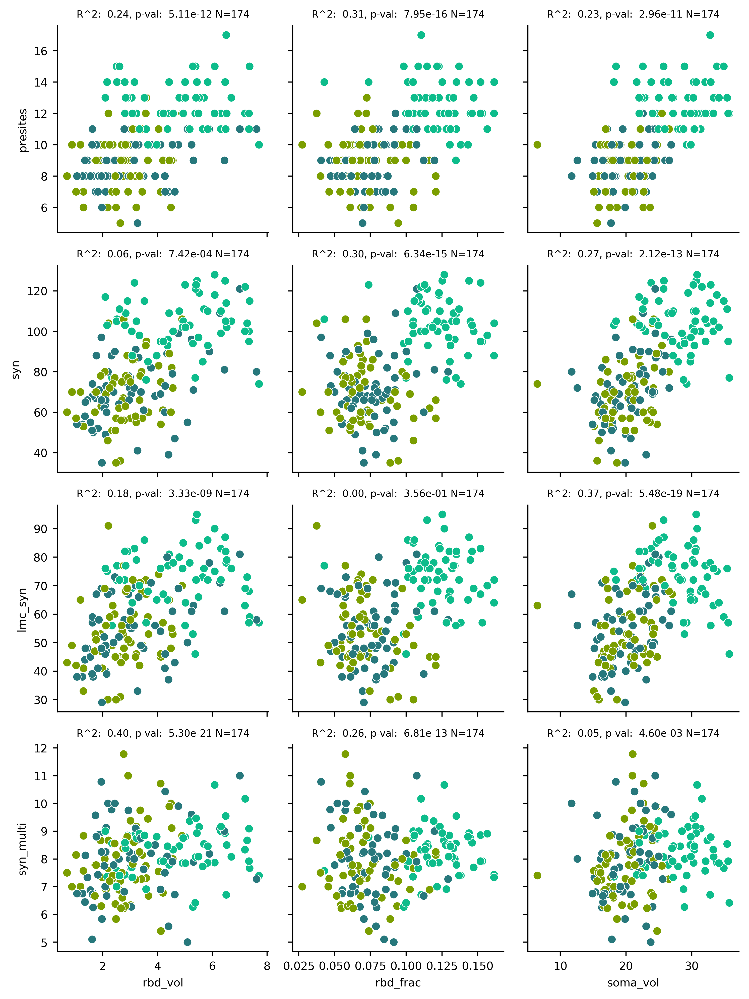

In [12]:
x_vars = ['rbd_vol', 'rbd_frac', 'soma_vol']
y_vars = ['presites', 'syn', 'lmc_syn', 'syn_multi']

incl_sts = svfs

data = long[long.index.get_level_values(1).isin(incl_sts)].reset_index()

g = sns.PairGrid(data, x_vars=x_vars, y_vars=y_vars, hue='subtype', palette=st_cm)
#g.map(sns.regplot)
g.map(sns.scatterplot)

res_table = pd.DataFrame(index=pd.MultiIndex.from_product([x_vars, y_vars]), columns=['R-squared', 'p-value'])

i = 0
axes = g.axes.flatten()

for this_x, this_y in itertools.product(x_vars, y_vars):
    X = sm.add_constant(data[this_x])
    Y = data[this_y]

    model = sm.OLS(Y, X)
    results = model.fit()
    res_table.loc[(this_x, this_y), 'R-squared'] = results.rsquared
    res_table.loc[(this_x, this_y), 'p-value'] = results.f_pvalue
    
    axes[i].set_title(f"R^2: {results.rsquared: .2f}, p-val: {results.f_pvalue: .2e} " +  
                      f"N={len(X)}", fontsize=7)
    i+=1

#g.add_legend()
plt.tight_layout()
plt.show()
#display(res_table)

if save_figs:
    g.savefig('/mnt/home/nchua/Dropbox/lamina_figures/pr-scatter-rhvars-outvars.svg')
    g.savefig('/mnt/home/nchua/Dropbox/lamina_figures/pr-scatter-rhvars-outvars.png')

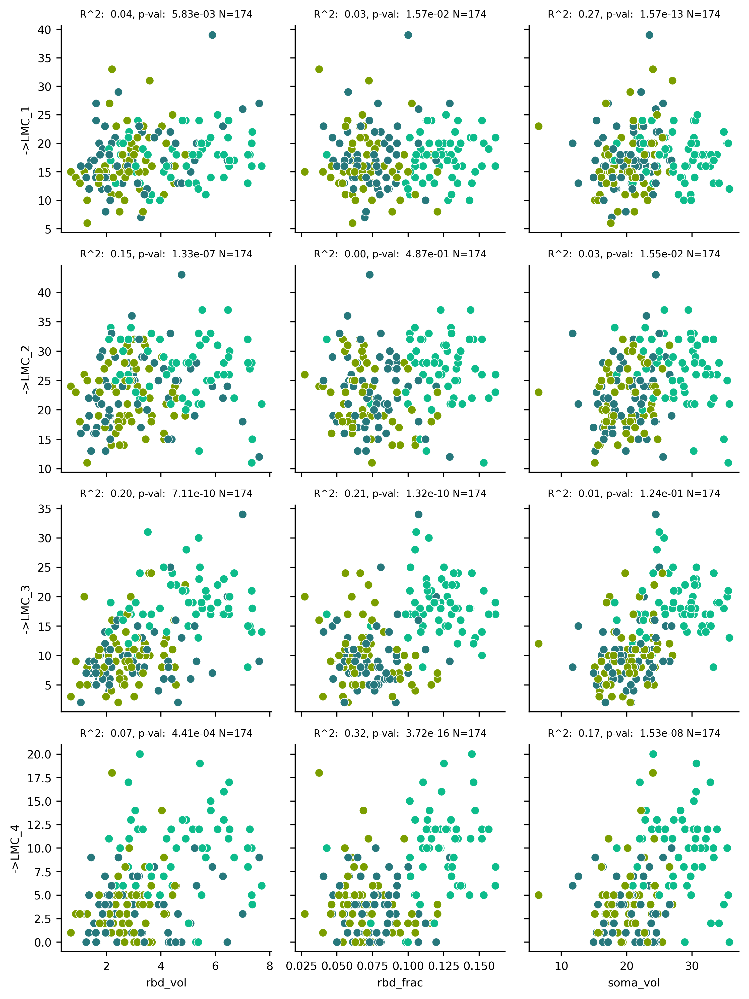

In [13]:
x_vars = ['rbd_vol', 'rbd_frac', 'soma_vol']
y_vars = ['->LMC_1', '->LMC_2', '->LMC_3', '->LMC_4']

incl_sts = svfs

data = long[long.index.get_level_values(1).isin(incl_sts)].reset_index()

g = sns.PairGrid(data, x_vars=x_vars, y_vars=y_vars, hue='subtype', palette=st_cm)
g.map(sns.scatterplot)

y_names = ["R1-6" + y for y in y_vars]
res_table = pd.DataFrame(index=pd.MultiIndex.from_product([x_vars, y_vars]), columns=['R-squared', 'p-value'])

i = 0
axes = g.axes.flatten()

for this_x, this_y in itertools.product(x_vars, y_vars):
    X = sm.add_constant(data[this_x])
    Y = data[this_y]

    model = sm.OLS(Y, X)
    results = model.fit()
    res_table.loc[(this_x, this_y), 'R-squared'] = results.rsquared
    res_table.loc[(this_x, this_y), 'p-value'] = results.f_pvalue
    
    axes[i].set_title(f"R^2: {results.rsquared: .2f}, p-val: {results.f_pvalue: .2e} " +  
                      f"N={len(X)}", fontsize=7)
    i+=1

#g.add_legend()
plt.tight_layout()
plt.show()
#display(res_table)

if save_figs:
    g.savefig('/mnt/home/nchua/Dropbox/lamina_figures/pr-scatter-rhvars-outL1-4.svg')
    g.savefig('/mnt/home/nchua/Dropbox/lamina_figures/pr-scatter-rhvars-outL1-4.png')

## Are these correlations present *within* SVF classes?  

### R1, R4, R3, and R6

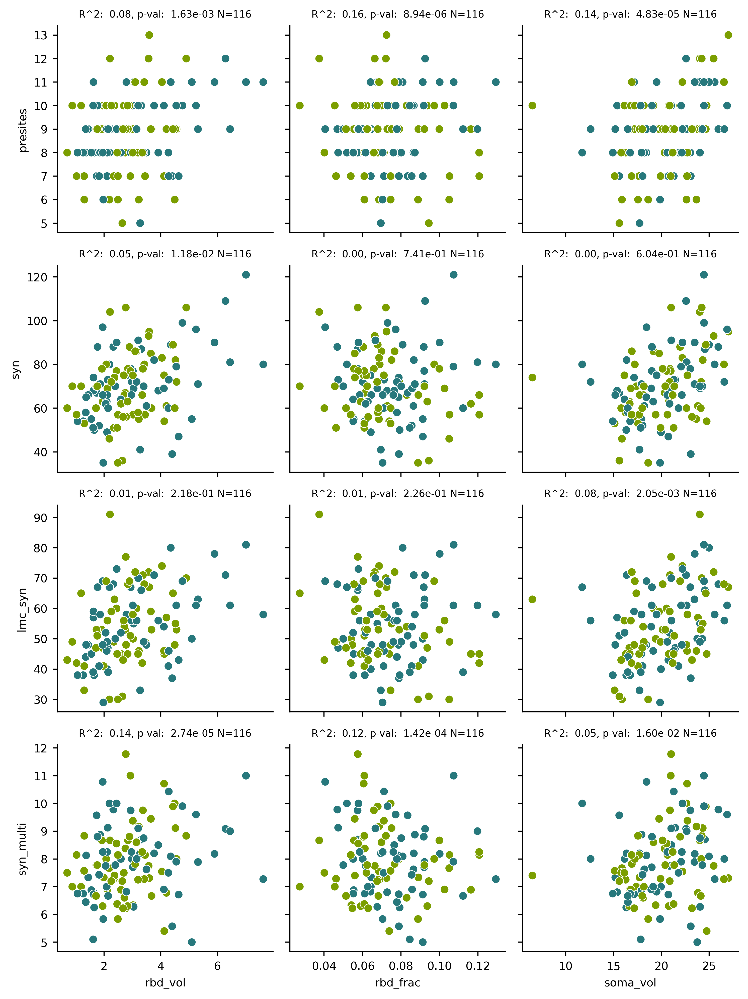

In [14]:
x_vars = ['rbd_vol', 'rbd_frac', 'soma_vol']
y_vars = ['presites', 'syn', 'lmc_syn', 'syn_multi']

incl_sts = ['R1', 'R4', 'R3', 'R6']

data = long[long.index.get_level_values(1).isin(incl_sts)].reset_index()

g = sns.PairGrid(data, x_vars=x_vars, y_vars=y_vars, hue='subtype', palette=st_cm)
g.map(sns.scatterplot)

i = 0
axes = g.axes.flatten()

res_table = pd.DataFrame(index=pd.MultiIndex.from_product([x_vars, y_vars]), columns=['R-squared', 'p-value'])

for this_x, this_y in itertools.product(x_vars, y_vars):
    X = sm.add_constant(data[this_x])
    Y = data[this_y]

    model = sm.OLS(Y, X)
    results = model.fit()
    res_table.loc[(this_x, this_y), 'R-squared'] = results.rsquared
    res_table.loc[(this_x, this_y), 'p-value'] = results.f_pvalue
    
    axes[i].set_title(f"R^2: {results.rsquared: .2f}, p-val: {results.f_pvalue: .2e} " +  
                      f"N={len(X)}", fontsize=7)
    i+=1

#g.add_legend()
plt.tight_layout()
plt.show()
#display(res_table)

if save_figs:
    g.savefig('/mnt/home/nchua/Dropbox/lamina_figures/pr-scatter-rhvars-outL1-4.svg')
    g.savefig('/mnt/home/nchua/Dropbox/lamina_figures/pr-scatter-rhvars-outL1-4.png')

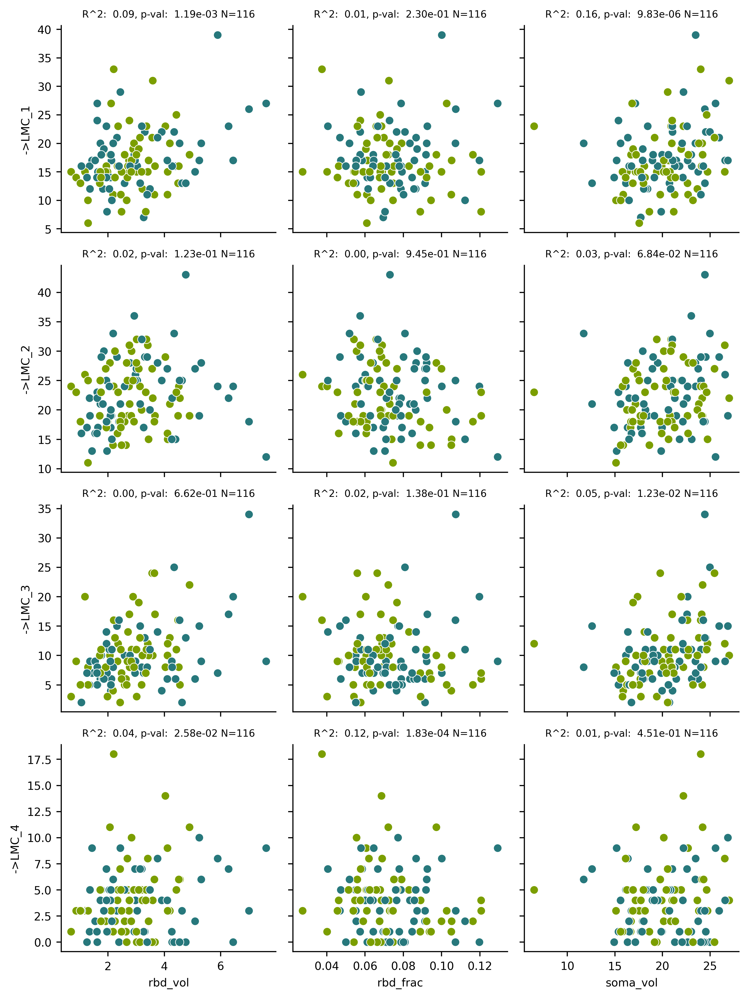

In [15]:
x_vars = ['rbd_vol', 'rbd_frac', 'soma_vol']
y_vars = ['->LMC_1', '->LMC_2', '->LMC_3', '->LMC_4']

incl_sts = ['R1', 'R4', 'R3', 'R6']

data = long[long.index.get_level_values(1).isin(incl_sts)].reset_index()

g = sns.PairGrid(data, x_vars=x_vars, y_vars=y_vars, hue='subtype', palette=st_cm)
g.map(sns.scatterplot)

i = 0
axes = g.axes.flatten()

res_table = pd.DataFrame(index=pd.MultiIndex.from_product([x_vars, y_vars]), columns=['R-squared', 'p-value'])

for this_x, this_y in itertools.product(x_vars, y_vars):
    X = sm.add_constant(data[this_x])
    Y = data[this_y]

    model = sm.OLS(Y, X)
    results = model.fit()
    res_table.loc[(this_x, this_y), 'R-squared'] = results.rsquared
    res_table.loc[(this_x, this_y), 'p-value'] = results.f_pvalue
    
    axes[i].set_title(f"R^2: {results.rsquared: .2f}, p-val: {results.f_pvalue: .2e} " +  
                      f"N={len(X)}", fontsize=7)
    i+=1

#g.add_legend()
plt.tight_layout()
plt.show()
#display(res_table)

if save_figs:
    g.savefig('/mnt/home/nchua/Dropbox/lamina_figures/pr-scatter-rhvars-outL1-4.svg')
    g.savefig('/mnt/home/nchua/Dropbox/lamina_figures/pr-scatter-rhvars-outL1-4.png')

## Ratio of these measures

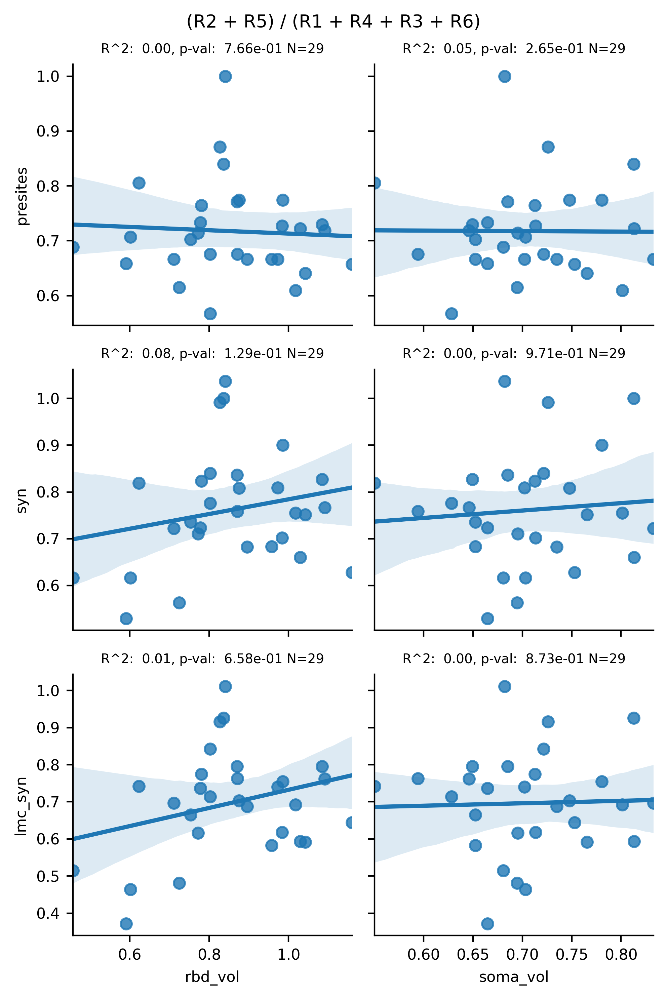

In [16]:
x_vars = ['rbd_vol', 'soma_vol']
y_vars = ['presites', 'syn', 'lmc_syn']

numer = ['R2', 'R5']
denom = ['R1', 'R4', 'R3', 'R6']

data_n = long[long.index.get_level_values(1).isin(numer)].reset_index()
data_n = data_n.groupby('om').sum()

data_d = long[long.index.get_level_values(1).isin(denom)].reset_index()
data_d = data_d.groupby('om').sum()

data = data_n / data_d

g = sns.PairGrid(data, x_vars=x_vars, y_vars=y_vars)
g.map(sns.regplot)

res_table = pd.DataFrame(index=pd.MultiIndex.from_product([x_vars, y_vars]), columns=['R-squared', 'p-value'])

i = 0
axes = g.axes.flatten()

for this_x, this_y in itertools.product(x_vars, y_vars):
    X = sm.add_constant(data[this_x])
    Y = data[this_y]

    model = sm.OLS(Y, X)
    results = model.fit()
    res_table.loc[(this_x, this_y), 'R-squared'] = results.rsquared
    res_table.loc[(this_x, this_y), 'p-value'] = results.f_pvalue
    

    axes[i].set_title(f"R^2: {results.rsquared: .2f}, p-val: {results.f_pvalue: .2e} " +  
                      f"N={len(X)}", fontsize=7)
    i+=1
    

plt.subplots_adjust(top=0.9)
g.fig.suptitle('(R2 + R5) / (R1 + R4 + R3 + R6)')
plt.tight_layout()
plt.show()

if save_figs:
    #g.savefig('/mnt/home/nchua/Dropbox/lamina_figures/201212_exploratory/.svg')
    g.savefig('/mnt/home/nchua/Dropbox/lamina_figures/201212_exploratory/r25-r1436-ratio.png')

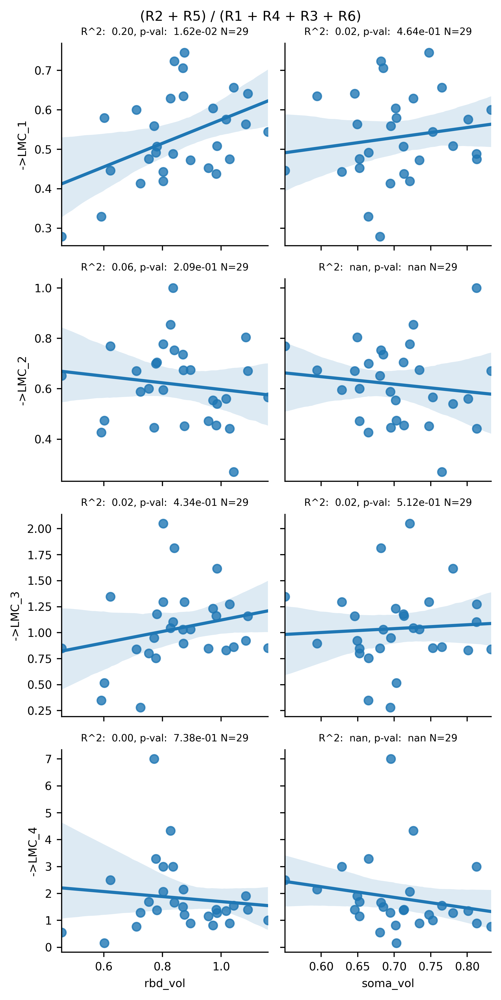

R-squared    p-value
rbd_vol  ->LMC_1    0.195752  0.0162467
         ->LMC_2   0.0200667   0.463559
         ->LMC_3   0.0577085   0.209395
         ->LMC_4         NaN        NaN
soma_vol ->LMC_1   0.0228017   0.434272
         ->LMC_2   0.0161033   0.511843
         ->LMC_3  0.00421118   0.738045
         ->LMC_4         NaN        NaN

In [17]:
x_vars = ['rbd_vol', 'soma_vol']
y_vars = ['->LMC_1', '->LMC_2', '->LMC_3', '->LMC_4']

numer = ['R2', 'R5']
denom = ['R1', 'R4', 'R3', 'R6']

data_n = long[long.index.get_level_values(1).isin(numer)].reset_index()
data_n = data_n.groupby('om').sum()

data_d = long[long.index.get_level_values(1).isin(denom)].reset_index()
data_d = data_d.groupby('om').sum()

data = data_n / data_d

g = sns.PairGrid(data, x_vars=x_vars, y_vars=y_vars)
g.map(sns.regplot)

res_table = pd.DataFrame(index=pd.MultiIndex.from_product([x_vars, y_vars]), columns=['R-squared', 'p-value'])

i = 0
axes = g.axes.flatten()

for this_x, this_y in itertools.product(x_vars, y_vars):
    X = sm.add_constant(data[this_x])
    Y = data[this_y]

    model = sm.OLS(Y, X)
    results = model.fit()
    res_table.loc[(this_x, this_y), 'R-squared'] = results.rsquared
    res_table.loc[(this_x, this_y), 'p-value'] = results.f_pvalue
    
    axes[i].set_title(f"R^2: {results.rsquared: .2f}, p-val: {results.f_pvalue: .2e} " +  
                      f"N={len(X)}", fontsize=7)
    i+=1

plt.subplots_adjust(top=0.9)
g.fig.suptitle('(R2 + R5) / (R1 + R4 + R3 + R6)')
plt.tight_layout()
plt.show()

display(res_table)

if save_figs:
    #g.savefig('/mnt/home/nchua/Dropbox/lamina_figures/201212_exploratory/.svg')
    g.savefig('/mnt/home/nchua/Dropbox/lamina_figures/201212_exploratory/r25-r1436-ratio-L1-4.png')

## Difference of these measures (R2 + R5) - (R1 + R4 + R3 + R6)

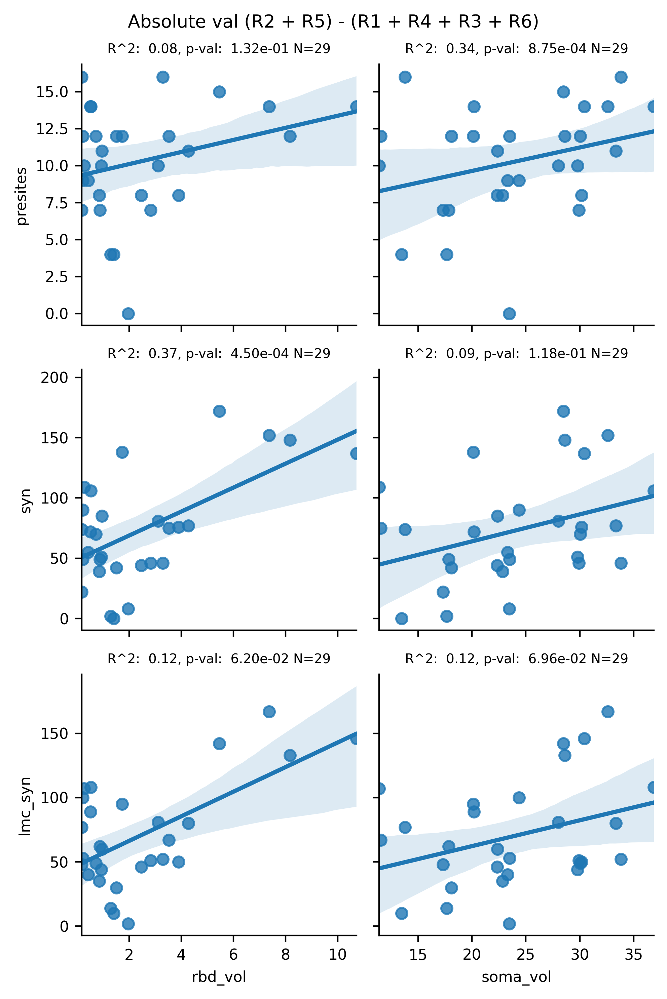

In [18]:
x_vars = ['rbd_vol', 'soma_vol']
y_vars = ['presites', 'syn', 'lmc_syn']

numer = ['R2', 'R5']
denom = ['R1', 'R4', 'R3', 'R6']

data_n = long[long.index.get_level_values(1).isin(numer)].reset_index()
data_n = data_n.groupby('om').sum()

data_d = long[long.index.get_level_values(1).isin(denom)].reset_index()
data_d = data_d.groupby('om').sum()

data = abs(data_n - data_d)

g = sns.PairGrid(data, x_vars=x_vars, y_vars=y_vars)
g.map(sns.regplot)

res_table = pd.DataFrame(index=pd.MultiIndex.from_product([x_vars, y_vars]), columns=['R-squared', 'p-value'])

i = 0
axes = g.axes.flatten()

for this_x, this_y in itertools.product(x_vars, y_vars):
    X = sm.add_constant(data[this_x])
    Y = data[this_y]

    model = sm.OLS(Y, X)
    results = model.fit()
    res_table.loc[(this_x, this_y), 'R-squared'] = results.rsquared
    res_table.loc[(this_x, this_y), 'p-value'] = results.f_pvalue
    
    axes[i].set_title(f"R^2: {results.rsquared: .2f}, p-val: {results.f_pvalue: .2e} " +  
                      f"N={len(X)}", fontsize=7)
    i+=1

plt.subplots_adjust(top=0.9)
g.fig.suptitle('Absolute val (R2 + R5) - (R1 + R4 + R3 + R6)')
plt.tight_layout()
plt.show()


if save_figs:
    #g.savefig('/mnt/home/nchua/Dropbox/lamina_figures/201212_exploratory/.svg')
    g.savefig('/mnt/home/nchua/Dropbox/lamina_figures/201212_exploratory/r25-r1436-diff.png')

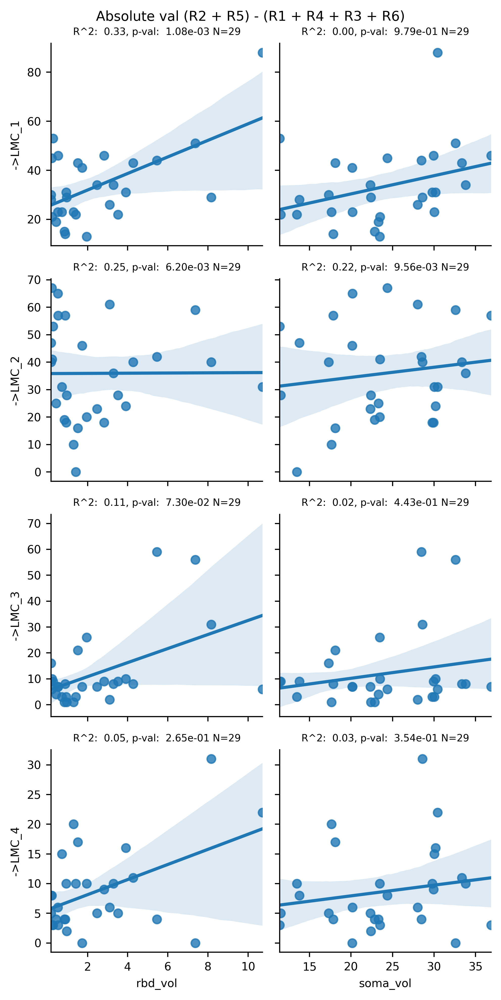

In [19]:
x_vars = ['rbd_vol', 'soma_vol']
y_vars = ['->LMC_1', '->LMC_2', '->LMC_3', '->LMC_4']

numer = ['R2', 'R5']
denom = ['R1', 'R4', 'R3', 'R6']

data_n = long[long.index.get_level_values(1).isin(numer)].reset_index()
data_n = data_n.groupby('om').sum()

data_d = long[long.index.get_level_values(1).isin(denom)].reset_index()
data_d = data_d.groupby('om').sum()

data = abs(data_n - data_d)

g = sns.PairGrid(data, x_vars=x_vars, y_vars=y_vars)
g.map(sns.regplot)

res_table = pd.DataFrame(index=pd.MultiIndex.from_product([x_vars, y_vars]), columns=['R-squared', 'p-value'])

i = 0
axes = g.axes.flatten()

for this_x, this_y in itertools.product(x_vars, y_vars):
    X = sm.add_constant(data[this_x])
    Y = data[this_y]

    model = sm.OLS(Y, X)
    results = model.fit()
    res_table.loc[(this_x, this_y), 'R-squared'] = results.rsquared
    res_table.loc[(this_x, this_y), 'p-value'] = results.f_pvalue
    
    axes[i].set_title(f"R^2: {results.rsquared: .2f}, p-val: {results.f_pvalue: .2e} " +  
                      f"N={len(X)}", fontsize=7)
    i+=1

plt.subplots_adjust(top=0.9)
g.fig.suptitle('Absolute val (R2 + R5) - (R1 + R4 + R3 + R6)')
plt.tight_layout()
plt.show()

if save_figs:
    #g.savefig('/mnt/home/nchua/Dropbox/lamina_figures/201212_exploratory/.svg')
    g.savefig('/mnt/home/nchua/Dropbox/lamina_figures/201212_exploratory/r25-r1436-diff-LMC.png')

### R1/R4

R-squared      p-value
rbd_vol  presites    0.168071   0.00139359
         syn         0.209182   0.00030687
         lmc_syn       0.1938  0.000544006
         syn_multi   0.049165    0.0943681
rbd_frac presites    0.107371    0.0120415
         syn        0.0146662     0.365167
         lmc_syn    0.0138492      0.37897
         syn_multi  0.0225203     0.260851
soma_vol presites    0.092812    0.0200605
         syn         0.146889   0.00298201
         lmc_syn      0.12298   0.00695705
         syn_multi  0.0495341    0.0931086

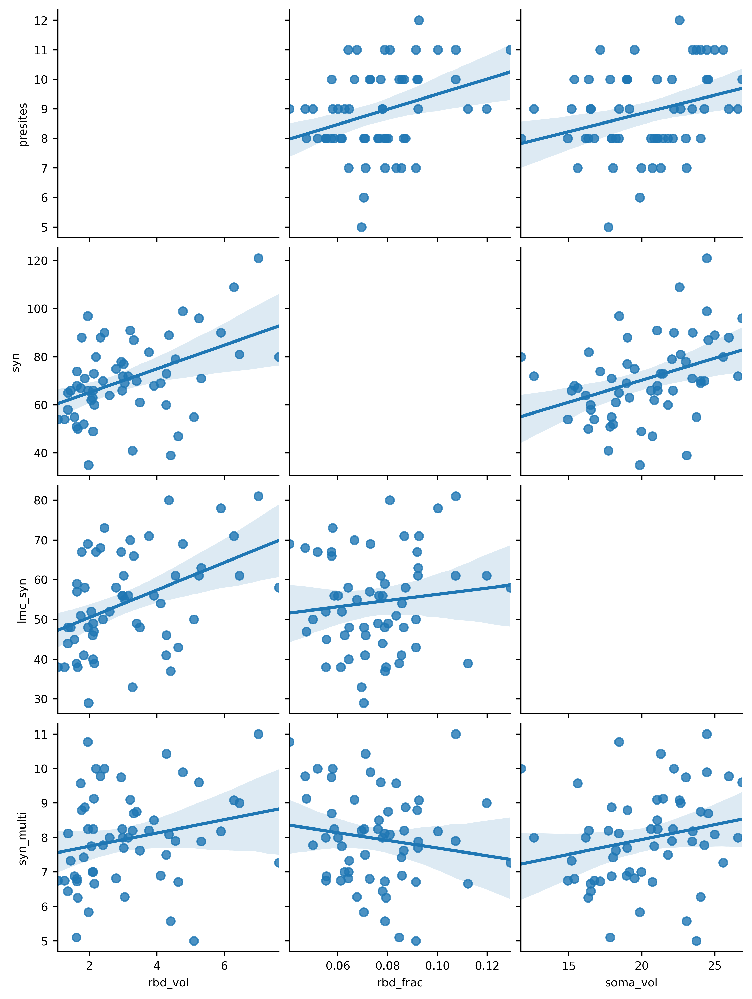

In [20]:
x_vars = ['rbd_vol', 'rbd_frac', 'soma_vol']
y_vars = ['presites', 'syn', 'lmc_syn', 'syn_multi']

data = long[long.index.get_level_values(1).isin(['R1', 'R4'])]
g = sns.pairplot(data, x_vars=x_vars, y_vars=y_vars, kind='reg')
res_table = pd.DataFrame(index=pd.MultiIndex.from_product([x_vars, y_vars]), columns=['R-squared', 'p-value'])

for this_x, this_y in itertools.product(x_vars, y_vars):
    X = sm.add_constant(data[this_x])
    Y = data[this_y]

    model = sm.OLS(Y, X)
    results = model.fit()
    res_table.loc[(this_x, this_y), 'R-squared'] = results.rsquared
    res_table.loc[(this_x, this_y), 'p-value'] = results.f_pvalue
#     display((X, Y))
#     display(f"R-squared: {results.rsquared}")
#     display(f"p-value (t-stat): {results.pvalues}")
display(res_table)

### R2 and R5

R-squared    p-value
rbd_vol  presites    0.00284897    0.69068
         syn         0.00989704   0.457482
         lmc_syn     0.00335518   0.665817
         syn_multi    0.0353773   0.157388
rbd_frac presites     0.0602224  0.0633469
         syn          0.0237376   0.248201
         lmc_syn    0.000221008   0.911807
         syn_multi   0.00764304   0.514038
soma_vol presites    0.00182808   0.749971
         syn        0.000170926   0.922405
         lmc_syn      0.0770686  0.0348692
         syn_multi  0.000742946   0.839055

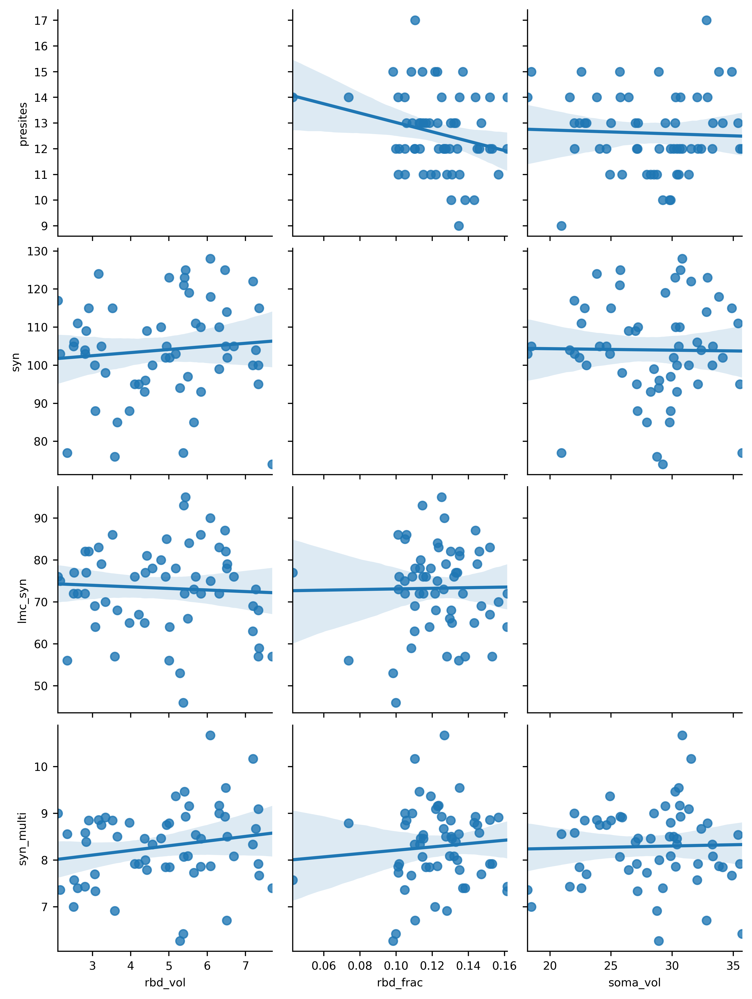

In [21]:
x_vars = ['rbd_vol', 'rbd_frac', 'soma_vol']
y_vars = ['presites', 'syn', 'lmc_syn', 'syn_multi']

data = long[long.index.get_level_values(1).isin(['R2', 'R5'])]
g = sns.pairplot(data, x_vars=x_vars, y_vars=y_vars, kind='reg')
res_table = pd.DataFrame(index=pd.MultiIndex.from_product([x_vars, y_vars]), columns=['R-squared', 'p-value'])

for this_x, this_y in itertools.product(x_vars, y_vars):
    X = sm.add_constant(data[this_x])
    Y = data[this_y]

    model = sm.OLS(Y, X)
    results = model.fit()
    res_table.loc[(this_x, this_y), 'R-squared'] = results.rsquared
    res_table.loc[(this_x, this_y), 'p-value'] = results.f_pvalue
#     display((X, Y))
#     display(f"R-squared: {results.rsquared}")
#     display(f"p-value (t-stat): {results.pvalues}")
display(res_table)

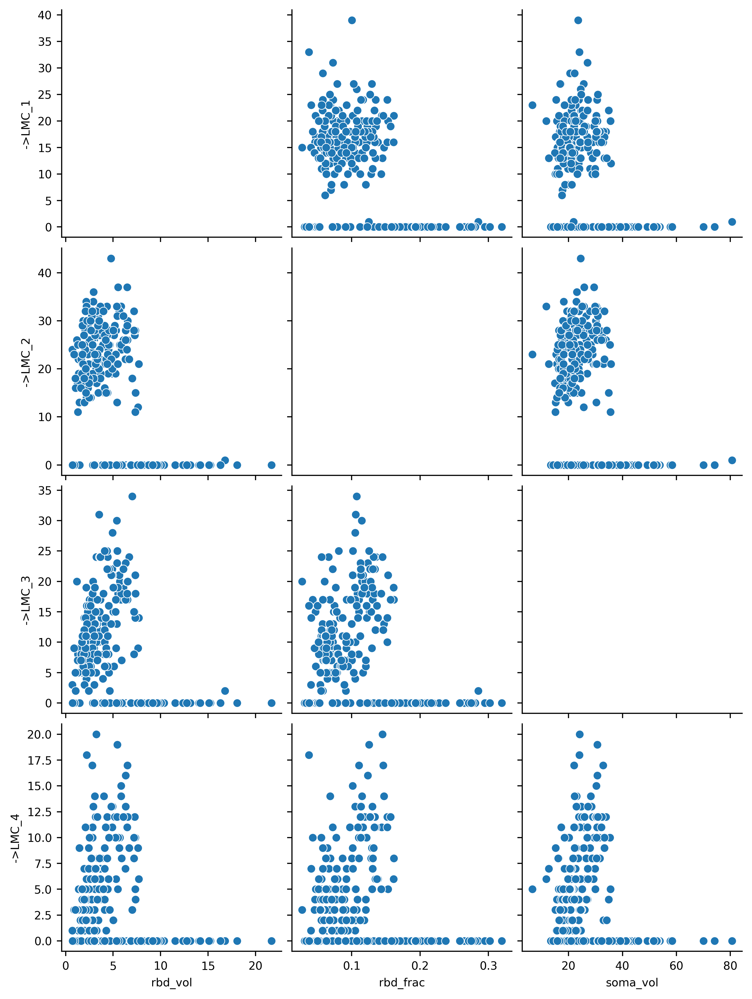

In [22]:
sns.pairplot(long, x_vars=['rbd_vol', 'rbd_frac', 'soma_vol'], y_vars=['->LMC_1', '->LMC_2', '->LMC_3', '->LMC_4'])

/mnt/home/nchua/miniconda3/envs/wasp-lite/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               presites   R-squared:                       0.103
Model:                            OLS   Adj. R-squared:                  0.099
Method:                 Least Squares   F-statistic:                     29.58
Date:                Thu, 17 Dec 2020   Prob (F-statistic):           1.24e-07
Time:                        14:53:50   Log-Likelihood:                -782.68
No. Observations:                 261   AIC:                             1569.
Df Residuals:                     259   BIC:                             1576.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.1305      0.531     17.200      0.000       8.085      10.176
rbd_vol       -0.5215      0.096     -5.439      0.000      -0.710      -0.333
==============================================================================
Omnibus:                       50.963   Durbin-Watson:                   1.037
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               12.340
Skew:                          -0.167   Prob(JB):                      0.00209
Kurtosis:                       1.988   Cond. No.                         9.96
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

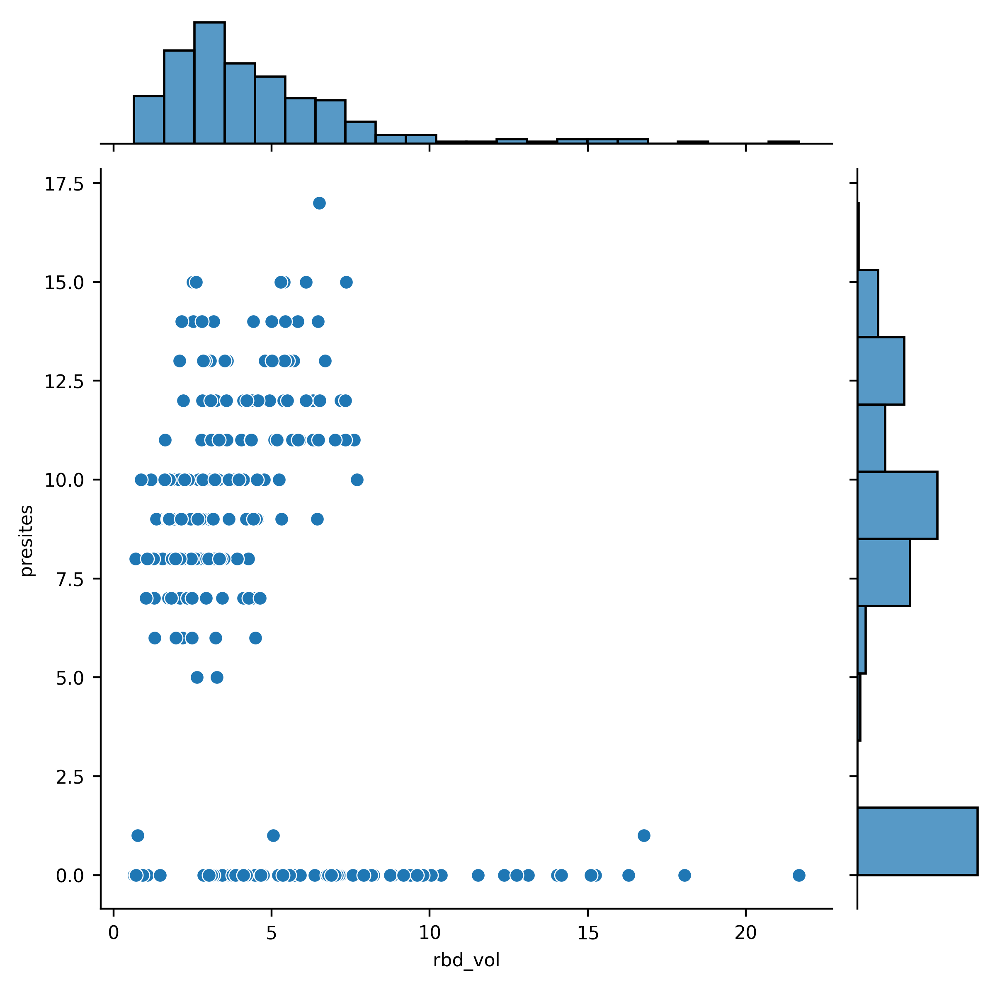

In [23]:
X = long['rbd_vol']
Y = long['presites']
sns.jointplot(X, Y)

# OLS
X = sm.add_constant(X)
model = sm.OLS(Y, X)
results = model.fit()

display(results.summary())

/mnt/home/nchua/miniconda3/envs/wasp-lite/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    syn   R-squared:                       0.082
Model:                            OLS   Adj. R-squared:                  0.078
Method:                 Least Squares   F-statistic:                     23.08
Date:                Thu, 17 Dec 2020   Prob (F-statistic):           2.63e-06
Time:                        14:53:51   Log-Likelihood:                -1336.8
No. Observations:                 261   AIC:                             2678.
Df Residuals:                     259   BIC:                             2685.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         71.8528      4.435     16.201      0.000      63.119      80.586
rbd_vol       -3.8492      0.801     -4.805      0.000      -5.427      -2.272
==============================================================================
Omnibus:                       67.255   Durbin-Watson:                   1.006
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               12.577
Skew:                          -0.030   Prob(JB):                      0.00186
Kurtosis:                       1.926   Cond. No.                         9.96
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

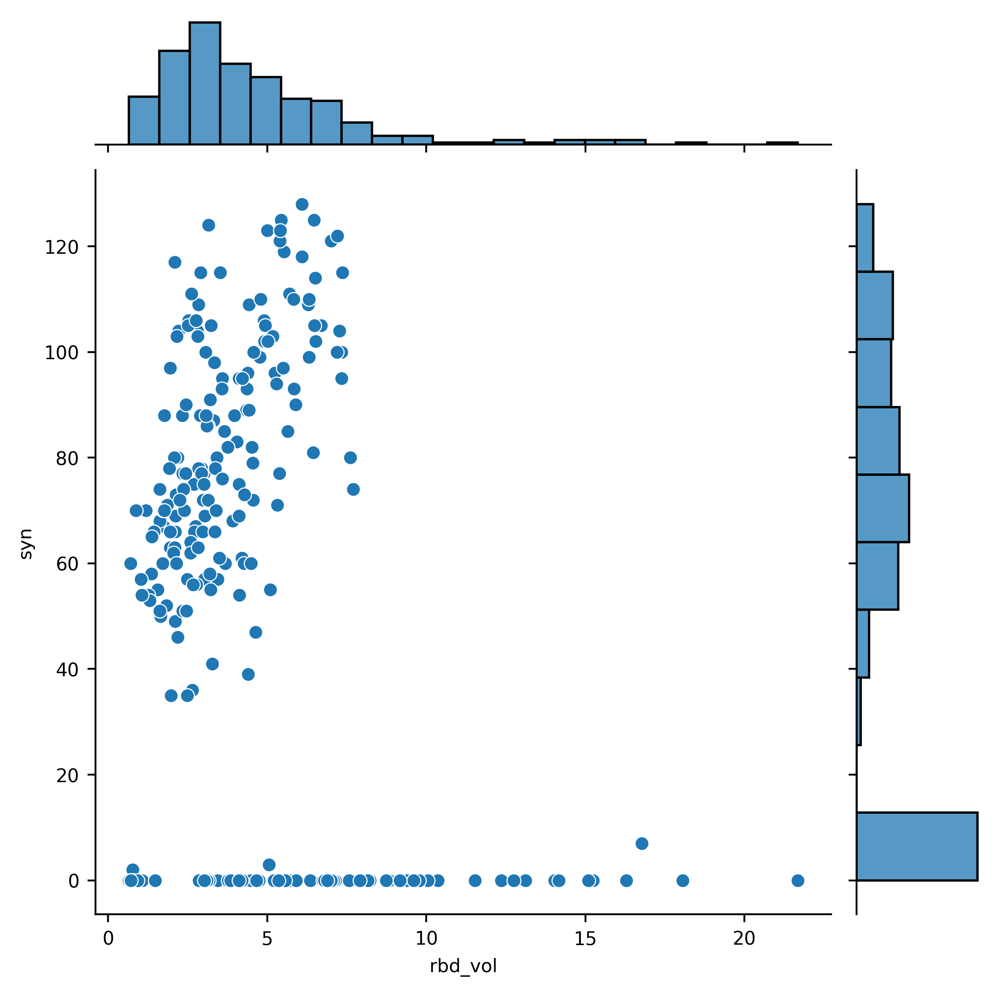

In [24]:
X = long['rbd_vol']
Y = long['syn']
sns.jointplot(X, Y)

# OLS
X = sm.add_constant(X)
model = sm.OLS(Y, X)
results = model.fit()

display(results.summary())

In [25]:
X = long['rdb_vol']
Y = long['lmc_syn']
sns.jointplot(X, Y)

# OLS
X = sm.add_constant(X)
model = sm.OLS(Y, X)
results = model.fit()

display(results.summary())

KeyError: 'rdb_vol'

In [ ]:
X = long['rbd_vol']
Y = long['syn_multi']
sns.jointplot(X, Y)

# OLS
X = sm.add_constant(X)
model = sm.OLS(Y, X)
results = model.fit()

display(results.summary())

- Rhabdomere volume (both raw and fractional) is positively correlated with both number of SVF output terminals and synapses. Number of terminals is a slightly better predictor or rhabdomere volume, but the difference in R-squared is small. 
- SVF synapse multiplicity (number of synapses per terminal) is relatively constant; i.e. the number of SVF output synapses scales predictably with number of terminals. Because of this, neither has a stronger correlation with rhabdomere volume 

## Does SVF volume correlate with number of outputs to the LMC subtypes?

In [ ]:
X = long['rbd_vol']
Y = long['->LMC_1']
sns.jointplot(X, Y)

# OLS
X = sm.add_constant(X)
model = sm.OLS(Y, X)
results = model.fit()

display(results.summary())

In [ ]:
X = long['rbd_vol']
Y = long['->LMC_2']
sns.jointplot(X, Y)

# OLS
X = sm.add_constant(X)
model = sm.OLS(Y, X)
results = model.fit()

display(results.summary())

In [ ]:
X = long['rbd_vol']
Y = long['->LMC_3']
sns.jointplot(X, Y)

# OLS
X = sm.add_constant(X)
model = sm.OLS(Y, X)
results = model.fit()

display(results.summary())

In [ ]:
X = long['rbd_vol']
Y = long['->LMC_4']
sns.jointplot(X, Y)

# OLS
X = sm.add_constant(X)
model = sm.OLS(Y, X)
results = model.fit()

display(results.summary())

In [ ]:
X = long['rbd_vol']
Y = long['->LMC_N']
sns.jointplot(X, Y)

# OLS
X = sm.add_constant(X)
model = sm.OLS(Y, X)
results = model.fit()

display(results.summary())

In [ ]:
# av_multi = df_outputs/df_presites
# r1r4_m = [*av_multi['R1'].to_list(), *av_multi['R4'].to_list()]
# r2r5_m = [*av_multi['R2'].to_list(), *av_multi['R5'].to_list()]
# r3r6_m = [*av_multi['R3'].to_list(), *av_multi['R6'].to_list()]

# r1r4_ntb = [*df_presites['R1'].to_list(), *df_presites['R4'].to_list()]
# r2r5_ntb = [*df_presites['R2'].to_list(), *df_presites['R5'].to_list()]
# r3r6_ntb = [*df_presites['R3'].to_list(), *df_presites['R6'].to_list()]

In [ ]:
max_sites = long['presites'].max().max()

sns.jointplot(df_presites['R1'], df_presites['R4'], xlim=(0, max_sites), ylim=(0, max_sites))

sns.jointplot(df_presites['R2'], df_presites['R5'], xlim=(0, max_sites), ylim=(0, max_sites))

sns.jointplot(df_presites['R3'], df_presites['R6'], xlim=(0, max_sites), ylim=(0, max_sites))


### R1R4 vs R3R6

In [ ]:
fig, axes = plt.subplots(2, 2, sharex=True, sharey=True, figsize=[15, 15])
ax = axes.flatten()
plot_lin_fit(df_lamina['R1R4->LMC_1'],df_lamina['R3R6->LMC_1'], ax[0], plot_kwargs={'color': 'r'}, scatter_kwargs={'c': 'k', 'marker':'x'})
ax[0].set_title('Number of inputs to L1')
ax[0].set_xlabel('R1R4')
ax[0].set_ylabel('R3R6')
plot_lin_fit(df_lamina['R1R4->LMC_2'],df_lamina['R3R6->LMC_2'], ax[1], plot_kwargs={'color': 'b'}, scatter_kwargs={'c': 'k', 'marker':'x'})
ax[1].set_title('Number of inputs to L2')
ax[1].set_xlabel('R1R4')
ax[1].set_ylabel('R3R6')
plot_lin_fit(df_lamina['R1R4->LMC_3'],df_lamina['R3R6->LMC_3'], ax[2], plot_kwargs={'color': 'g'}, scatter_kwargs={'c': 'k', 'marker':'x'})
ax[2].set_title('Number of inputs to L3')
ax[2].set_xlabel('R1R4')
ax[2].set_ylabel('R3R6')
plot_lin_fit(df_lamina['R1R4->LMC_4'].dropna(),df_lamina['R3R6->LMC_4'].dropna(), ax[3], plot_kwargs={'color': 'y'}, scatter_kwargs={'c': 'k', 'marker':'x'})
ax[3].set_title('Number of inputs to L4')
ax[3].set_xlabel('R1R4')
ax[3].set_ylabel('R3R6')

#plot_lin_fit(df_lamina['R1R4->LMC_4'],df_lamina['R3R6->LMC_4'], ax, plot_kwargs={'color': 'r'}, scatter_kwargs={'color': 'r'})
plt.show()

In [ ]:
# fig, axes = plt.subplots(3, 1, figsize=[20, 30])
# ax = axes.flatten()
# cm = get_cmap('coolwarm')

# frac = (df_lamina.loc[:, 'R1R4->LMC_1']/df_lamina.loc[:, 'R3R6->LMC_1']) - 1.0
# nd = {om: {'colour': cm(frac[om])} for om in ommatidia}
# hexplot(node_data=nd, ax=ax[0])

# frac = (df_lamina.loc[:, 'R1R4->LMC_2']/df_lamina.loc[:, 'R3R6->LMC_2']) - 1.0
# nd = {om: {'colour': cm(frac[om])} for om in ommatidia}
# hexplot(node_data=nd, ax=ax[1])

# frac = (df_lamina.loc[:, 'R1R4->LMC_3']/df_lamina.loc[:, 'R3R6->LMC_3']) - 1.0
# nd = {om: {'colour': cm(frac[om])} for om in ommatidia}
# hexplot(node_data=nd, ax=ax[2])

### R2R5 vs (R1R4 + R3R6)

In [ ]:
fig, axes = plt.subplots(2, 2, sharex=True, sharey=True, figsize=[15, 15])
ax = axes.flatten()
plot_lin_fit(2 * df_lamina['R2R5->LMC_1'], df_lamina['R1R4->LMC_1'] + df_lamina['R3R6->LMC_1'], 
             ax[0], plot_kwargs={'color': 'r'}, scatter_kwargs={'c': 'k', 'marker':'x'})
ax[0].set_title('Number of inputs to L1')
ax[0].set_xlabel('R2R5')
ax[0].set_ylabel('R1R4 + R3R6')
plot_lin_fit(2 * df_lamina['R2R5->LMC_2'], df_lamina['R1R4->LMC_2'] + df_lamina['R3R6->LMC_2'], 
             ax[1], plot_kwargs={'color': 'b'}, scatter_kwargs={'c': 'k', 'marker':'x'})
ax[1].set_title('Number of inputs to L2')
ax[1].set_xlabel('R2R5')
ax[1].set_ylabel('R1R4 + R3R6')
plot_lin_fit(2 * df_lamina['R2R5->LMC_3'], df_lamina['R1R4->LMC_3'] + df_lamina['R3R6->LMC_3'], 
             ax[2], plot_kwargs={'color': 'g'}, scatter_kwargs={'c': 'k', 'marker':'x'})
ax[2].set_title('Number of inputs to L3')
ax[2].set_xlabel('R2R5')
ax[2].set_ylabel('R1R4 + R3R6')
plot_lin_fit(2 * df_lamina['R2R5->LMC_4'].dropna(), df_lamina['R1R4->LMC_4'].dropna() + df_lamina['R3R6->LMC_4'].dropna(), 
             ax[3], plot_kwargs={'color': 'y'}, scatter_kwargs={'c': 'k', 'marker':'x'})
ax[3].set_title('Number of inputs to L4')
ax[3].set_xlabel('R2R5')
ax[3].set_ylabel('R1R4 + R3R6')

plt.show()

In [ ]:
fig, ax = plt.subplots(1)
plot_lin_fit(df_lamina['centri->LMC_1'],df_lamina['R3R6->LMC_1'], ax)
plt.show()

In [ ]:
fig, ax = plt.subplots(1)
plot_lin_fit(df_lamina['centri->LMC_3'], df_lamina['R1R4->LMC_3'] + df_lamina['R3R6->LMC_3'], ax)
plt.show()

frac = (df_lamina['centri->LMC_3']/ df_lamina['R1R4->LMC_3']).sort_values()
display(frac)

In [ ]:
display(df_lamina['centri->LMC_3'])
display(df_lamina['centri->LMC_1'])

Consistent vs. Inconsistent 
- Frequency at which the connection is observed

High vs. Low
- Mean contact count 

In [ ]:
def n_morethan_0(df):
    n_observed = []
    for c in df.columns:
        n_observed.append((df[c] > 0.0).sum())
    return pd.Series(n_observed, index=df.columns)

n_ob = n_morethan_0(df_lamina)
p_ob = n_ob / n_ob.max()
fig, ax = plt.subplots(1)
ax.set_xlabel("% ommatidia connection observed > 0")
ax.set_ylabel("Number of connection types")

ax = p_ob.plot.hist()
#ax = sns.distplot(p_ob, bins=50, kde=False)
#ax = sns.distplot(p_ob, kde=False)
plt.show()

In [ ]:
p_ob = n_ob / n_ob.max()
ob_df = pd.DataFrame(data={'mean': df_lamina.mean(),
                          'percent_om_obs': p_ob}, index=df_lamina.columns)

In [ ]:
print(f"Connections that are observed less than 100% but have contact count mean more than 1.0")
x = ob_df.loc[(df_lamina.mean() > 1.0) & (ob_df['percent_om_obs'] < 1.0)].sort_values(by='mean', ascending=False)
display(x)
#len(df_lamina.columns[(df_lamina.mean() > 1.0) & (ob_df['percent_om_obs'] < 1.0)])

In [ ]:
dat = df_lamina['R2R5->LMC_4'].plot.hist(bins=50)

In [ ]:
fig, ax = plt.subplots(len(x.index), 1)
for i, c in enumerate(x.index):
    print(c)
    ax[i].hist(df_lamina[c])
plt.show()

In [ ]:
print(f"Connections that are observed consistently (100%) but have contact count mean less than 1.0")
display(df_lamina.mean()[(df_lamina.mean() < 1.0) & (ob_df['percent_om_obs'] == 1.0)])
len(df_lamina.columns[(df_lamina.mean() < 1.0) & (ob_df['percent_om_obs'] == 1.0)])

In [ ]:
# Interested in connections with mean close to 0, bin all high counts together
upper_bin = 10.0
x = [upper_bin if mn >= upper_bin else mn for mn in df_lamina.mean()]

fig, ax = plt.subplots(1, figsize=[15, 10])
ax.set_title("Mean number of contacts for each possible connection type\n" + 
             f"Total subtype permutations: {len(df_lamina.columns)}\n" + 
            f"Mean >= {upper_bin} combined in the last bin")

ax.set_xlabel("Mean number of contacts")
ax.set_ylabel("Number of connection types")

ax.hist(x, bins=100)
plt.show()
#display(x)

In [ ]:
# Interested in connections with mean close to 0, bin all high counts together
upper_bin = 10.0
x = [upper_bin if mn >= upper_bin else mn for mn in df_lamina.median()]

fig, ax = plt.subplots(1, figsize=[15, 10])
ax.set_title("MEDIAN number of contacts for each possible connection type\n" + 
             f"Total subtype permutations: {len(df_lamina.columns)}\n" + 
            f"MEDIAN >= {upper_bin} combined in the last bin")

ax.set_xlabel("MEDIAN number of contacts")
ax.set_ylabel("Number of connection types")

ax.hist(x, bins=100)
plt.show()
#display(x)

In [ ]:
upper_bin = 100
x = df_lamina.values.flatten()
x = x[~df_lamina.isna().values.flatten()]  # Discard L4 NaNs 

x = [int(upper_bin) if ob >= upper_bin else int(ob) for ob in x]

fig, ax = plt.subplots(1, figsize=[15, 10])
ax.set_title("All observed contact counts between every neuron\n" + 
             f"N obervations = {len(x)}\n" + 
            f"Counts >= {upper_bin} combined in the last bin")

ax.set_xlabel("Number of contacts")
ax.set_ylabel("Number of observations")

ax.hist(x, bins=100)
plt.show()
#display(x)

In [ ]:
low_means = df_lamina.mean()[df_lamina.mean() < 1.0]

display(df_lamina.mean()[df_lamina.mean() < 1.0].sort_values(ascending=False))